https://medium.com/@curiousily/predicting-house-prices-with-linear-regression-machine-learning-from-scratch-part-ii-47a0238aeac1

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
from pylab import rcParams
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from matplotlib import rc
import unittest

%matplotlib inline

sns.set(style='whitegrid', palette='muted', font_scale=1.5)

rcParams['figure.figsize'] = 14, 8

RANDOM_SEED = 42

np.random.seed(RANDOM_SEED)

def run_tests():
  unittest.main(argv=[''], verbosity=1, exit=False)

In [9]:
import pandas as pd
import io
import requests

url = "https://raw.githubusercontent.com/Data-Science-FMI/ml-from-scratch-2019/master/data/house_prices_train.csv"
f = requests.get(url).content
df_train = pd.read_csv(io.StringIO(f.decode('utf-8')))

In [10]:
df_train.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


# Exploration 

In [11]:
df_train['SalePrice'].describe()

count      1460.000000
mean     180921.195890
std       79442.502883
min       34900.000000
25%      129975.000000
50%      163000.000000
75%      214000.000000
max      755000.000000
Name: SalePrice, dtype: float64

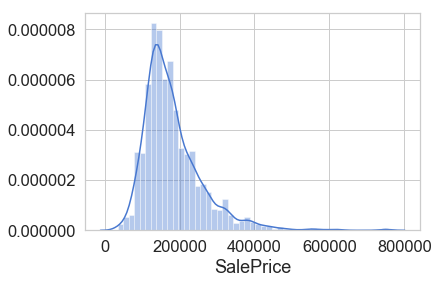

In [17]:
sns.distplot(df_train['SalePrice'])

- Most of the density lies between 100k and 250k, but there appears to be a lot of outliers on the pricier side.


- Next, let’s have a look at the greater living area (square feet) against the sale price.

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


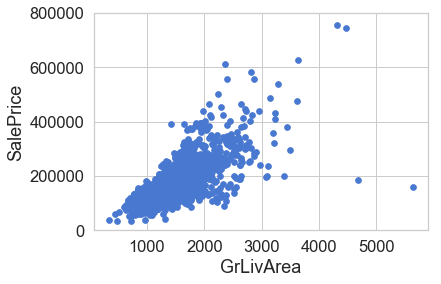

In [18]:
var = 'GrLivArea'
data = pd.concat([df_train['SalePrice'], df_train[var]], axis=1)
data.plot.scatter(x=var, y='SalePrice', ylim=(0,800000), s=32);

- You might’ve expected that larger living area should mean a higher price. This chart shows you’re generally correct. But what are those 2–3 “cheap” houses offering huge living area?


- One column you might not think about exploring is the “TotalBsmtSF” — Total square feet of the basement area, but let’s do it anyway.

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


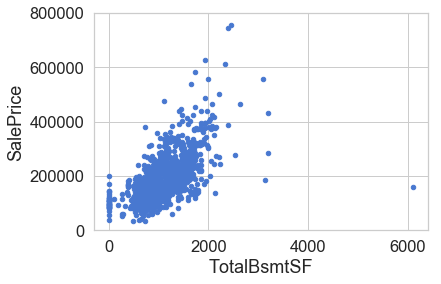

In [19]:
var = 'TotalBsmtSF'
data = pd.concat([df_train['SalePrice'], df_train[var]], axis=1)
data.plot.scatter(x=var, y='SalePrice', ylim=(0,800000));

- Intriguing, isn’t it? The basement area seems like it might have a lot of predictive power for our model.


- Ok, last one. Let’s look at “OverallQual” — overall material and finish quality. Of course, this one seems like a much more subjective feature, so it might provide a bit different perspective on the sale price.

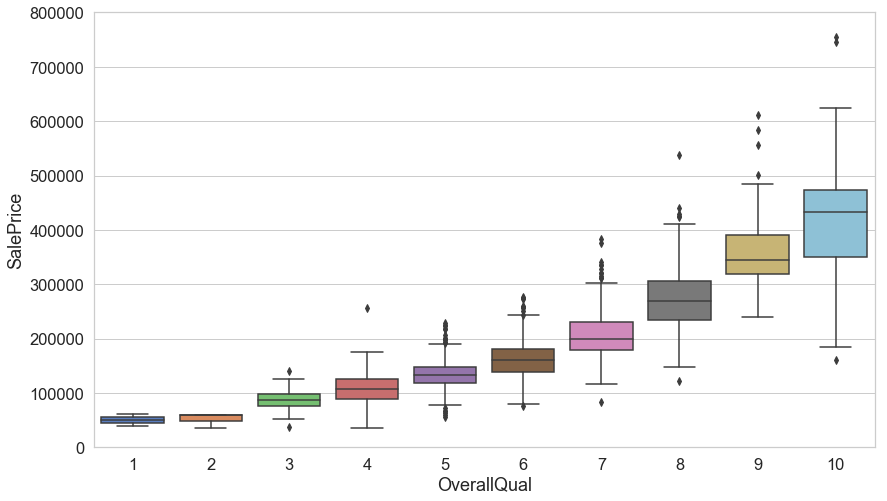

In [20]:
var = 'OverallQual'
data = pd.concat([df_train['SalePrice'], df_train[var]], axis=1)
f, ax = plt.subplots(figsize=(14, 8))
fig = sns.boxplot(x=var, y="SalePrice", data=data)
fig.axis(ymin=0, ymax=800000);

- Everything seems fine for this one, except that when you look to the right things start getting much more nuanced. Will that “confuse” our model?


- Let’s have a more general view on correlated features with the sale price.

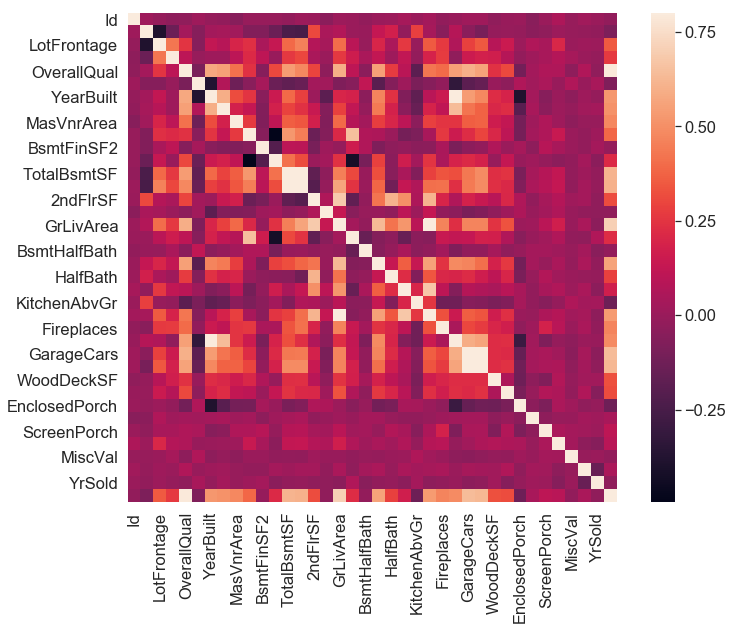

In [21]:
corrmat = df_train.corr()
f, ax = plt.subplots(figsize=(12, 9))
sns.heatmap(corrmat, vmax=.8, square=True);

- Let’s have a more general view on the top 8 correlated features with the sale price

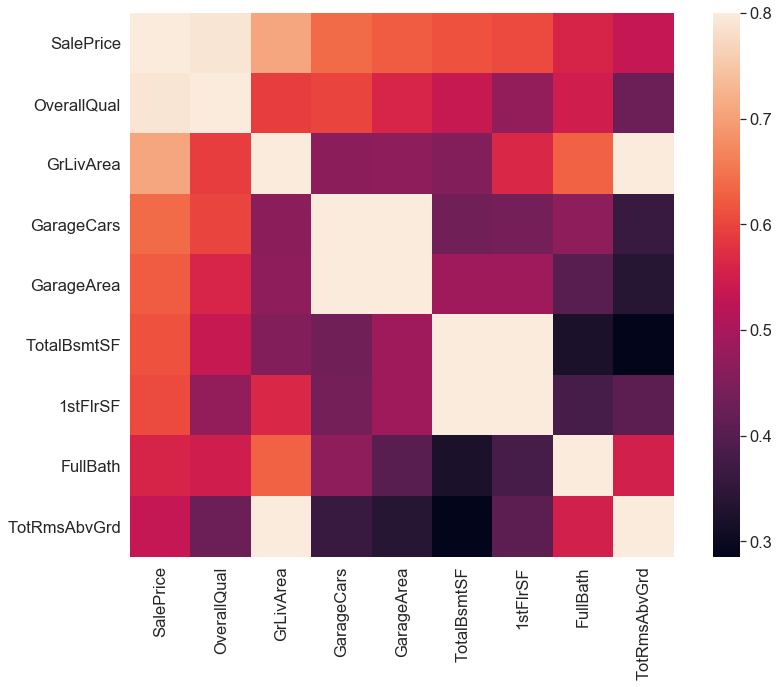

In [22]:
k = 9 #number of variables for heatmap
cols = corrmat.nlargest(k, 'SalePrice')['SalePrice'].index
f, ax = plt.subplots(figsize=(14, 10))
sns.heatmap(df_train[cols].corr(), vmax=.8, square=True);

- Surprised? All the features we discussed so far appear to be present. Its almost like we knew them from the start…

C:\Users\yassir.idsougou\AppData\Local\Continuum\anaconda3\lib\site-packages\seaborn\axisgrid.py:2065: UserWarning: The `size` parameter has been renamed to `height`; pleaes update your code.
  warnings.warn(msg, UserWarning)


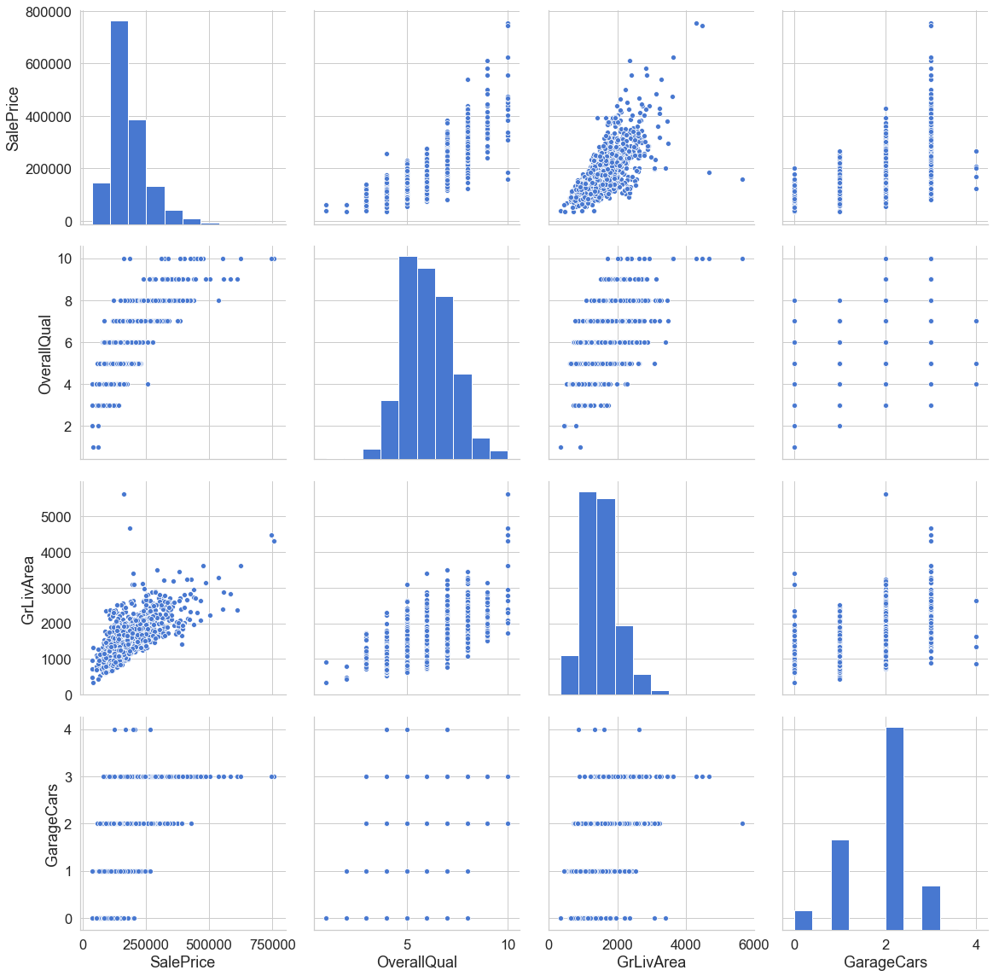

In [23]:
cols = ['SalePrice', 'OverallQual', 'GrLivArea', 'GarageCars']
sns.pairplot(df_train[cols], size = 4);

# Do we have missing data?

In [24]:
total = df_train.isnull().sum().sort_values(ascending=False)
percent = (df_train.isnull().sum()/df_train.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data.head(20)

,Total,Percent
PoolQC,1453,0.995205
MiscFeature,1406,0.963014
Alley,1369,0.937671
Fence,1179,0.807534
FireplaceQu,690,0.472603
LotFrontage,259,0.177397
GarageCond,81,0.055479
GarageType,81,0.055479
GarageYrBlt,81,0.055479
GarageFinish,81,0.055479


- We still haven’t discussed ways to “handle” missing data, so we’ll handle them like a boss — just not use those features.

# Predicting the sale price


**1 - Feature scaling**

We will do a little preprocessing to our data using the following formula (standardization):

    x' = ( x - µ )/σ

    where µ is the population mean and σ is the standard deviation.

In [26]:
x = df_train['GrLivArea']
y = df_train['SalePrice']

x = (x - x.mean()) / x.std()
x = np.c_[np.ones(x.shape[0]), x] 

In [27]:
x.shape

(1460, 2)

- We will only use the greater living area feature for our first model.

**2 - Linear Regression**

Linear regression models assume that the relationship between a dependent continuous variable  Y  and one or more explanatory (independent) variables  X  is linear (that is, a straight line). It’s used to predict values within a continuous range, (e.g. sales, price) rather than trying to classify them into categories (e.g. cat, dog). Linear regression models can be divided into two main types:

*Simple Linear Regression:*

Simple linear regression uses a traditional slope-intercept form, where  a  and  b  are the coefficients that we try to “learn” and produce the most accurate predictions.  X  represents our input data and  Y  is our prediction.

    Y = bX + a

*Multivariable Regression:*

A more complex, multi-variable linear equation might look like this, where w represents the coefficients, or weights, our model will try to learn.

    Y(x1,x2,x3) = w1x1 + w2x2 + w3x3 + w0 
    The variables  x1,x2,x3  represent the attributes, or distinct pieces of information, we have about each observation

**Loss function**
Given our Simple Linear Regression equation:

        Y = bX + a 
We can use the following cost function to find the coefficients:

**Mean Squared Error (MSE) Cost Function**

The MSE is defined as:

        MSE=J(W)=1m∑i=1m(y(i)−hw(x(i)))2 
where

        hw(x)=g(wTx) 
The MSE measures how much the average model predictions vary from the correct values. The number is higher when the model is performing "bad" on the training set.

The first derivative of MSE is given by:

        MSE′=J′(W)=2m∑i=1m(hw(x(i))−y(i)) 
One Half Mean Squared Error (OHMSE)
We will apply a small modification to the MSE - multiply by  12  so when we take the derivative, the 2s cancel out:

        OHMSE=J(W)=12m∑i=1m(y(i)−hw(x(i)))2 
The first derivative of OHMSE is given by:

        OHMSE′=J′(W)=1m∑i=1m(hw(x(i))−y(i))

In [29]:
def loss(h, y):
  sq_error = (h - y)**2
  n = len(y)
  return 1.0 / (2*n) * sq_error.sum()

In [30]:
class TestLoss(unittest.TestCase):

  def test_zero_h_zero_y(self):
    self.assertAlmostEqual(loss(h=np.array([0]), y=np.array([0])), 0)

  def test_one_h_zero_y(self):
    self.assertAlmostEqual(loss(h=np.array([1]), y=np.array([0])), 0.5)

  def test_two_h_zero_y(self):
    self.assertAlmostEqual(loss(h=np.array([2]), y=np.array([0])), 2)
    
  def test_zero_h_one_y(self):
    self.assertAlmostEqual(loss(h=np.array([0]), y=np.array([1])), 0.5)
    
  def test_zero_h_two_y(self):
    self.assertAlmostEqual(loss(h=np.array([0]), y=np.array([2])), 2)

In [31]:
run_tests()

.....
----------------------------------------------------------------------
Ran 5 tests in 0.005s

OK


In [32]:
class LinearRegression:
  
  def predict(self, X):
    return np.dot(X, self._W)
  
  def _gradient_descent_step(self, X, targets, lr):

    predictions = self.predict(X)
    
    error = predictions - targets
    gradient = np.dot(X.T,  error) / len(X)

    self._W -= lr * gradient
      
  def fit(self, X, y, n_iter=100000, lr=0.01):

    self._W = np.zeros(X.shape[1])

    self._cost_history = []
    self._w_history = [self._W]
    for i in range(n_iter):
      
        prediction = self.predict(X)
        cost = loss(prediction, y)
        
        self._cost_history.append(cost)
        
        self._gradient_descent_step(x, y, lr)
        
        self._w_history.append(self._W.copy())
    return self

- You might find our Linear Regression implementation simpler compared to the one presented for the Logistic Regression. Note that the use of the Gradient Descent algorithm is pretty much the same. Interesting, isn’t it? A single algorithm can build two different types of models. 

In [33]:
class TestLinearRegression(unittest.TestCase):

    def test_find_coefficients(self):
      clf = LinearRegression()
      clf.fit(x, y, n_iter=2000, lr=0.01)
      np.testing.assert_array_almost_equal(clf._W, np.array([180921.19555322,  56294.90199925]))

In [34]:
run_tests()

......
----------------------------------------------------------------------
Ran 6 tests in 1.050s

OK


**3 - Predicting the sale price with our first model**

In [35]:
clf = LinearRegression()
clf.fit(x, y, n_iter=2000, lr=0.01)

In [36]:
clf._W

array([180921.19555322,  56294.90199925])

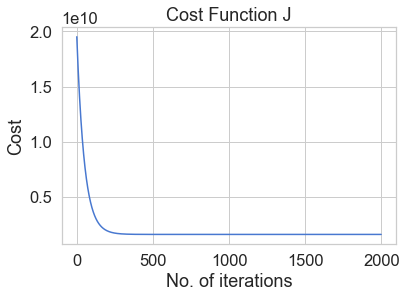

In [37]:
plt.title('Cost Function J')
plt.xlabel('No. of iterations')
plt.ylabel('Cost')
plt.plot(clf._cost_history)
plt.show()

- Our cost, at the last iteration, has a value of:

In [38]:
clf._cost_history[-1]

1569921604.8332634

In [39]:
#Animation

#Set the plot up,
fig = plt.figure()
ax = plt.axes()
plt.title('Sale Price vs Living Area')
plt.xlabel('Living Area in square feet (normalised)')
plt.ylabel('Sale Price ($)')
plt.scatter(x[:,1], y)
line, = ax.plot([], [], lw=2, color='red')
annotation = ax.text(-1, 700000, '')
annotation.set_animated(True)
plt.close()

#Generate the animation data,
def init():
    line.set_data([], [])
    annotation.set_text('')
    return line, annotation

# animation function.  This is called sequentially
def animate(i):
    x = np.linspace(-5, 20, 1000)
    y = clf._w_history[i][1]*x + clf._w_history[i][0]
    line.set_data(x, y)
    annotation.set_text('Cost = %.2f e10' % (clf._cost_history[i]/10000000000))
    return line, annotation

anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=300, interval=10, blit=True)

rc('animation', html='jshtml')

anim

**3 - Multivariable Linear Regression**

- Now that the implementation of our new model is done, we can use it. Done!?

You see, young padawan, the magical world of software development has those mythical creates called abstractions. While it might be extraordinarily hard to get them right, they might reduce the complexity of the code you write by (pretty much) a ton.

You just used one such abstraction — called vectorization. Essentially, that allowed us to build a Multivariable Linear Regression model without the need to loop over all features in our dataset. 

In [40]:
x = df_train[['OverallQual', 'GrLivArea', 'GarageCars']]

x = (x - x.mean()) / x.std()
x = np.c_[np.ones(x.shape[0]), x] 

clf = LinearRegression()
clf.fit(x, y, n_iter=2000, lr=0.01)

In [41]:
clf._W

array([180921.19555322,  37478.604254  ,  26631.93830568,  15921.22581327])

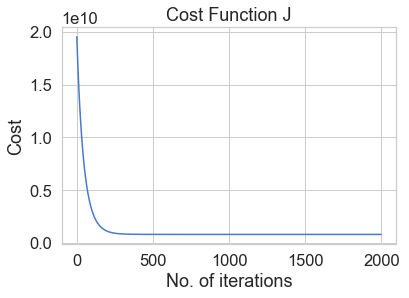

In [42]:
plt.title('Cost Function J')
plt.xlabel('No. of iterations')
plt.ylabel('Cost')
plt.plot(clf._cost_history)
plt.show()

In [44]:
clf._cost_history[-1]

822817042.8437101

- The loss at the last iteration is nearly 2 times smaller.